In [71]:
import pandas as pd 

df = pd.read_csv("uber.csv")

df["Date/Time"] = pd.to_datetime(df["Date/Time"])
df["weekday"] = df["Date/Time"].dt.day_name()
df["day"] = df["Date/Time"].dt.day
df["minute"] = df["Date/Time"].dt.minute
df["month"] = df["Date/Time"].dt.month
df["hour"] = df["Date/Time"].dt.hour
df["year"] = df["Date/Time"].dt.year

df

,Date/Time,Lat,Lon,Base,weekday,day,minute,month,hour,year
0,2014-05-01 00:02:00,40.7521,-73.9914,B02512,Thursday,1,2,5,0,2014
1,2014-05-01 00:06:00,40.6965,-73.9715,B02512,Thursday,1,6,5,0,2014
2,2014-05-01 00:15:00,40.7464,-73.9838,B02512,Thursday,1,15,5,0,2014
3,2014-05-01 00:17:00,40.7463,-74.0011,B02512,Thursday,1,17,5,0,2014
4,2014-05-01 00:17:00,40.7594,-73.9734,B02512,Thursday,1,17,5,0,2014
...,...,...,...,...,...,...,...,...,...,...
4534322,2014-04-30 23:22:00,40.7640,-73.9744,B02764,Wednesday,30,22,4,23,2014
4534323,2014-04-30 23:26:00,40.7629,-73.9672,B02764,Wednesday,30,26,4,23,2014
4534324,2014-04-30 23:31:00,40.7443,-73.9889,B02764,Wednesday,30,31,4,23,2014
4534325,2014-04-30 23:32:00,40.6756,-73.9405,B02764,Wednesday,30,32,4,23,2014


In [72]:
def count_rows(rows):
    return len(rows)

by_cross = df.groupby(["weekday", "hour"]).apply(count_rows)
by_cross

/var/folders/q2/2h4p204s56d3vhv_jx5hmc6m0000gn/T/ipykernel_17953/147646770.py:4: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  by_cross = df.groupby(["weekday", "hour"]).apply(count_rows)


weekday    hour
Friday     0       13716
           1        8163
           2        5350
           3        6930
           4        8806
                   ...  
Wednesday  19      47017
           20      47772
           21      44553
           22      32868
           23      18146
Length: 168, dtype: int64

In [73]:
def stok(kuantitas): 
    if kuantitas > 5:
        return "Banyak"
    else:
        return "Sedikit"

data = pd.DataFrame({
    "produk" : ["a", "b", "c"],
    "quantity" : [10,5,8],
    "harga" : [20000, 30000,40000]
})

data["kondisi stok"] = data["quantity"].apply(stok)
data

,produk,quantity,harga,kondisi stok
0,a,10,20000,Banyak
1,b,5,30000,Sedikit
2,c,8,40000,Banyak


In [74]:
by_cross

weekday    hour
Friday     0       13716
           1        8163
           2        5350
           3        6930
           4        8806
                   ...  
Wednesday  19      47017
           20      47772
           21      44553
           22      32868
           23      18146
Length: 168, dtype: int64

In [75]:
pivot = by_cross.unstack() # unstack = merubah groupby menjadi pivot tabel
group = pivot.stack() # stack = merubah pivot table menjadi groupby
pivot

hour,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
weekday,,,,,,,,,,,,,,,,,,,,,
Friday,13716,8163,5350,6930,8806,13450,23412,32061,31509,25230,...,36206,43673,48169,51961,54762,49595,43542,48323,49409,41260
Monday,6436,3737,2938,6232,9640,15032,23746,31159,29265,22197,...,28157,32744,38770,42023,37000,34159,32849,28925,20158,11811
Saturday,27633,19189,12710,9542,6846,7084,8579,11014,14411,17669,...,31418,38769,43512,42844,45883,41098,38714,43826,47951,43174
Sunday,32877,23015,15436,10597,6374,6169,6596,8728,12128,16401,...,28151,31112,33038,31521,28291,25948,25076,23967,19566,12166
Thursday,9293,5290,3719,5637,8505,14169,27065,37038,35431,27812,...,36699,44442,50560,56704,55825,51907,51990,51953,44194,27764
Tuesday,6237,3509,2571,4494,7548,14241,26872,36599,33934,25023,...,34846,41338,48667,55500,50186,44789,44661,39913,27712,14869
Wednesday,7644,4324,3141,4855,7511,13794,26943,36495,33826,25635,...,35148,43388,50684,55637,52732,47017,47772,44553,32868,18146


<Axes: xlabel='hour', ylabel='weekday'>

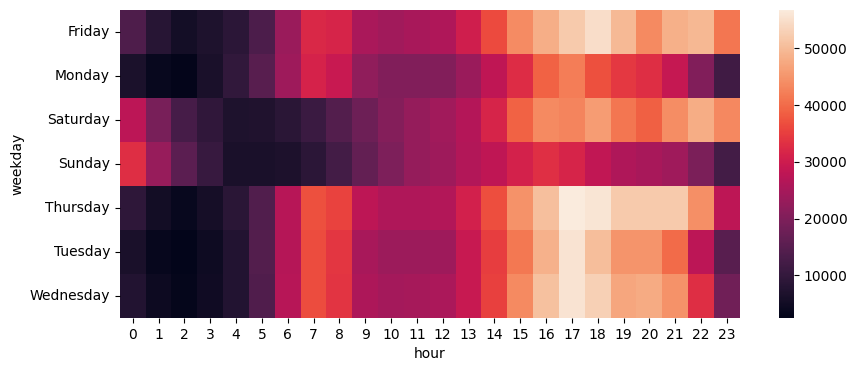

In [76]:
import seaborn as sns 
import matplotlib.pyplot as plt

plt.figure(figsize=(10,4))
sns.heatmap(pivot)

In [77]:
df

,Date/Time,Lat,Lon,Base,weekday,day,minute,month,hour,year
0,2014-05-01 00:02:00,40.7521,-73.9914,B02512,Thursday,1,2,5,0,2014
1,2014-05-01 00:06:00,40.6965,-73.9715,B02512,Thursday,1,6,5,0,2014
2,2014-05-01 00:15:00,40.7464,-73.9838,B02512,Thursday,1,15,5,0,2014
3,2014-05-01 00:17:00,40.7463,-74.0011,B02512,Thursday,1,17,5,0,2014
4,2014-05-01 00:17:00,40.7594,-73.9734,B02512,Thursday,1,17,5,0,2014
...,...,...,...,...,...,...,...,...,...,...
4534322,2014-04-30 23:22:00,40.7640,-73.9744,B02764,Wednesday,30,22,4,23,2014
4534323,2014-04-30 23:26:00,40.7629,-73.9672,B02764,Wednesday,30,26,4,23,2014
4534324,2014-04-30 23:31:00,40.7443,-73.9889,B02764,Wednesday,30,31,4,23,2014
4534325,2014-04-30 23:32:00,40.6756,-73.9405,B02764,Wednesday,30,32,4,23,2014


/var/folders/q2/2h4p204s56d3vhv_jx5hmc6m0000gn/T/ipykernel_17953/338097273.py:4: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  by_day = df.groupby(["day", "month"]).apply(count_rows)


<Axes: xlabel='month', ylabel='day'>

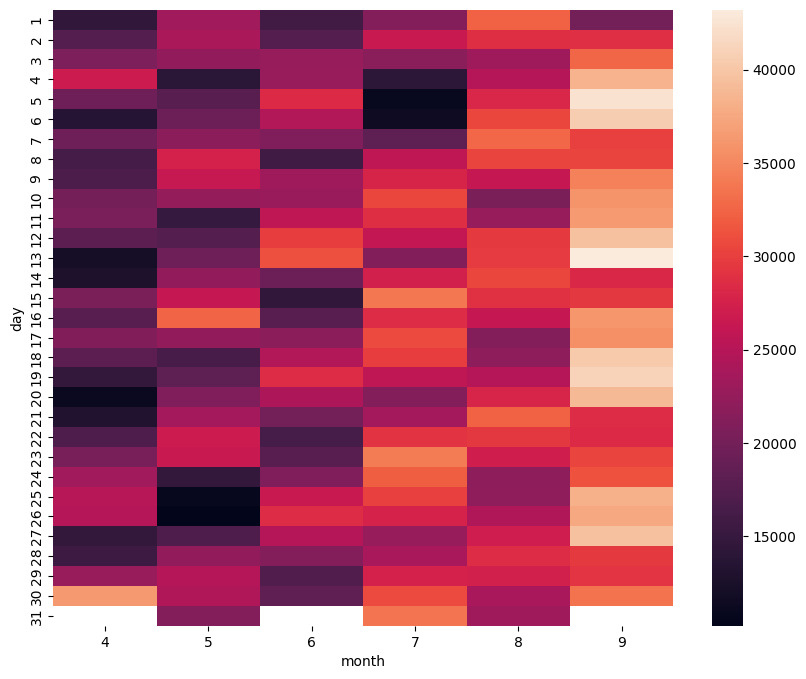

In [78]:
def count_rows(rows):
    return len(rows)

by_day = df.groupby(["day", "month"]).apply(count_rows)
pivot_day = by_day.unstack()

plt.figure(figsize=(10,8))
sns.heatmap(pivot_day)

In [79]:
df[df["month"] == 4]

,Date/Time,Lat,Lon,Base,weekday,day,minute,month,hour,year
3969811,2014-04-01 00:11:00,40.7690,-73.9549,B02512,Tuesday,1,11,4,0,2014
3969812,2014-04-01 00:17:00,40.7267,-74.0345,B02512,Tuesday,1,17,4,0,2014
3969813,2014-04-01 00:21:00,40.7316,-73.9873,B02512,Tuesday,1,21,4,0,2014
3969814,2014-04-01 00:28:00,40.7588,-73.9776,B02512,Tuesday,1,28,4,0,2014
3969815,2014-04-01 00:33:00,40.7594,-73.9722,B02512,Tuesday,1,33,4,0,2014
...,...,...,...,...,...,...,...,...,...,...
4534322,2014-04-30 23:22:00,40.7640,-73.9744,B02764,Wednesday,30,22,4,23,2014
4534323,2014-04-30 23:26:00,40.7629,-73.9672,B02764,Wednesday,30,26,4,23,2014
4534324,2014-04-30 23:31:00,40.7443,-73.9889,B02764,Wednesday,30,31,4,23,2014
4534325,2014-04-30 23:32:00,40.6756,-73.9405,B02764,Wednesday,30,32,4,23,2014


/var/folders/q2/2h4p204s56d3vhv_jx5hmc6m0000gn/T/ipykernel_17953/2115860082.py:4: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  by_month = df[df["month"] == 4].groupby(["weekday", "month"]).apply(count_rows)


<Axes: xlabel='month', ylabel='weekday'>

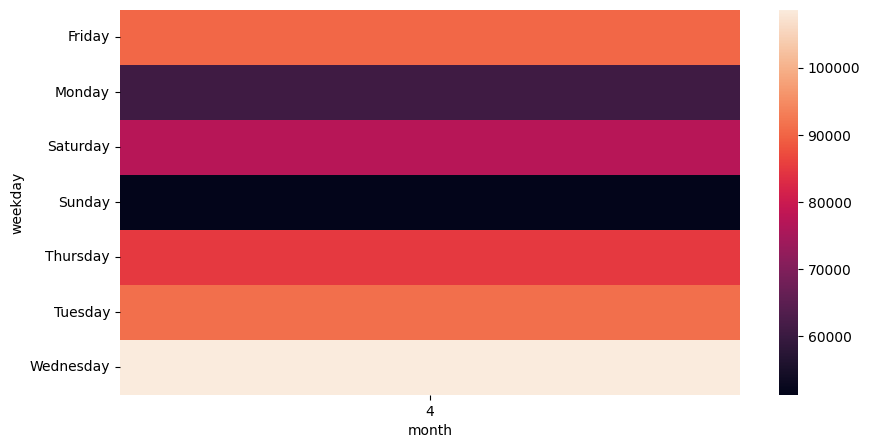

In [80]:
def count_rows(rows):
    return len(rows)

by_month = df[df["month"] == 4].groupby(["weekday", "month"]).apply(count_rows)
pivot_month = by_month.unstack()

plt.figure(figsize=(10,5))
sns.heatmap(pivot_month)

In [81]:
data_peta = df.groupby(["Lat", "Lon"])["weekday"].count()
data_peta_reset = data_peta.reset_index()
data_peta_reset

,Lat,Lon,weekday
0,39.6569,-74.2258,1
1,39.6686,-74.1607,1
2,39.7214,-74.2446,1
3,39.8416,-74.1512,1
4,39.9055,-74.0791,1
...,...,...,...
574553,41.3730,-72.9237,1
574554,41.3737,-73.7988,1
574555,41.5016,-72.8987,1
574556,41.5276,-72.7734,2


In [82]:
import folium 
from folium.plugins import HeatMap

basemap = folium.Map()

HeatMap(data_peta_reset).add_to(basemap)

basemap

Assignment 1

In [83]:
janjun = pd.read_csv("uber-traffic/uber-raw-data-janjune-15.csv")
janjun

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID
0,B02617,2015-05-17 09:47:00,B02617,141
1,B02617,2015-05-17 09:47:00,B02617,65
2,B02617,2015-05-17 09:47:00,B02617,100
3,B02617,2015-05-17 09:47:00,B02774,80
4,B02617,2015-05-17 09:47:00,B02617,90
...,...,...,...,...
14270474,B02765,2015-05-08 15:43:00,B02765,186
14270475,B02765,2015-05-08 15:43:00,B02765,263
14270476,B02765,2015-05-08 15:43:00,B02765,90
14270477,B02765,2015-05-08 15:44:00,B01899,45


In [84]:
janjun.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14270479 entries, 0 to 14270478
Data columns (total 4 columns):
 #   Column                Dtype 
---  ------                ----- 
 0   Dispatching_base_num  object
 1   Pickup_date           object
 2   Affiliated_base_num   object
 3   locationID            int64 
dtypes: int64(1), object(3)
memory usage: 435.5+ MB


In [85]:
janjun.isnull().sum()

Dispatching_base_num         0
Pickup_date                  0
Affiliated_base_num     162195
locationID                   0
dtype: int64

In [86]:
janjun.fillna(0, inplace=True)

In [87]:
janjun.isnull().sum()

Dispatching_base_num    0
Pickup_date             0
Affiliated_base_num     0
locationID              0
dtype: int64

No 1 & 2

In [88]:
print(janjun["Pickup_date"].max())
print(janjun["Pickup_date"].min())

2015-06-30 23:59:00
2015-01-01 00:00:05


No 3

In [89]:
janjun["Pickup_date"] = pd.to_datetime(janjun["Pickup_date"])
janjun["nama_hari"] = janjun["Pickup_date"].dt.day_name()
janjun["tanggal"] = janjun["Pickup_date"].dt.day
janjun["menit"] = janjun["Pickup_date"].dt.minute
janjun["bulan"] = janjun["Pickup_date"].dt.month
janjun["jam"] = janjun["Pickup_date"].dt.hour
janjun["detik"] = janjun["Pickup_date"].dt.second

janjun

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID,nama_hari,tanggal,menit,bulan,jam,detik
0,B02617,2015-05-17 09:47:00,B02617,141,Sunday,17,47,5,9,0
1,B02617,2015-05-17 09:47:00,B02617,65,Sunday,17,47,5,9,0
2,B02617,2015-05-17 09:47:00,B02617,100,Sunday,17,47,5,9,0
3,B02617,2015-05-17 09:47:00,B02774,80,Sunday,17,47,5,9,0
4,B02617,2015-05-17 09:47:00,B02617,90,Sunday,17,47,5,9,0
...,...,...,...,...,...,...,...,...,...,...
14270474,B02765,2015-05-08 15:43:00,B02765,186,Friday,8,43,5,15,0
14270475,B02765,2015-05-08 15:43:00,B02765,263,Friday,8,43,5,15,0
14270476,B02765,2015-05-08 15:43:00,B02765,90,Friday,8,43,5,15,0
14270477,B02765,2015-05-08 15:44:00,B01899,45,Friday,8,44,5,15,0


No 4

<Axes: xlabel='bulan'>

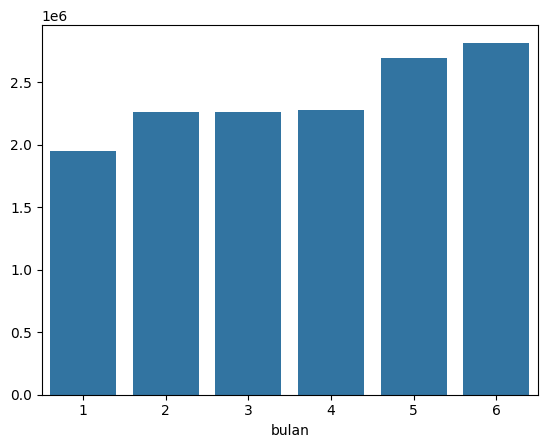

In [90]:
group = janjun.groupby("bulan")["bulan"].count()
sns.barplot(x = group.index, y = group.values)

No 5

<Axes: xlabel='jam'>

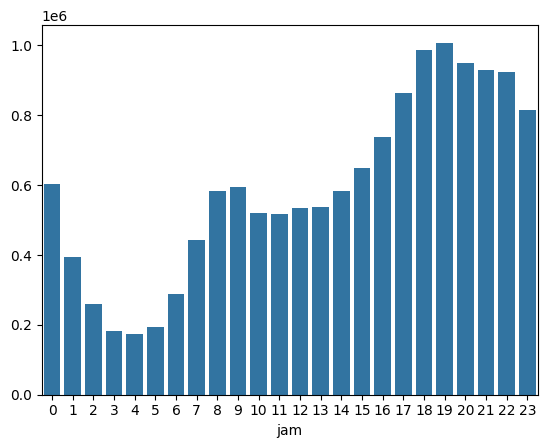

In [91]:
traffic = janjun.groupby("jam")["jam"].count()
sns.barplot(x = traffic.index, y = traffic.values)

In [102]:
janjun.columns

Index(['Dispatching_base_num', 'Pickup_date', 'Affiliated_base_num',
       'locationID', 'nama_hari', 'tanggal', 'menit', 'bulan', 'jam', 'detik'],
      dtype='object')

No 6

<Axes: xlabel='jam', ylabel='locationID'>

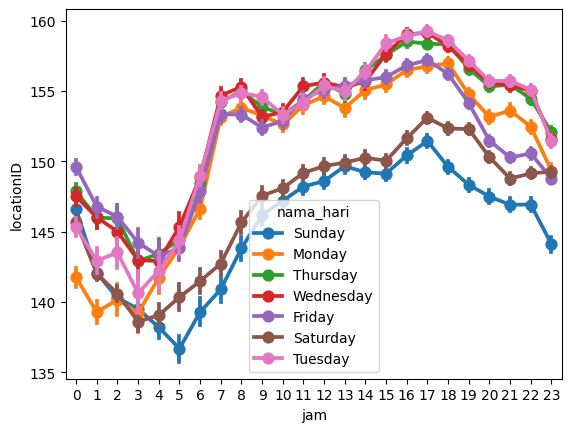

In [103]:
sns.pointplot(x = "jam", y = "locationID", hue = "nama_hari", data = janjun)

<Axes: xlabel='jam', ylabel='nama_hari'>

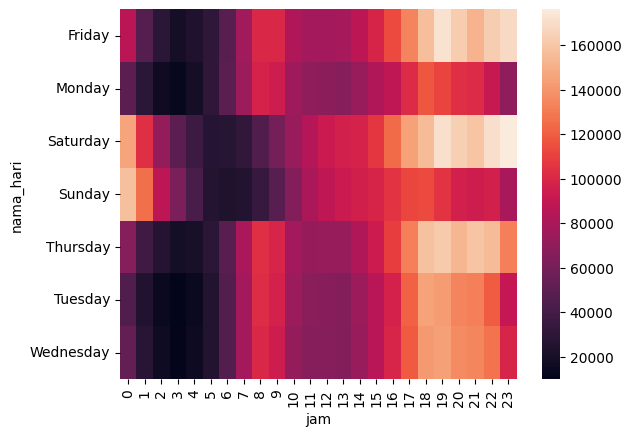

In [94]:
hari = janjun.groupby(["nama_hari", "jam"])["jam"].count()
pivot = hari.unstack()

sns.heatmap(pivot)

Assignment 2

In [104]:
janfeb = pd.read_csv("Uber-Jan-Feb-FOIL.csv")
janfeb

,dispatching_base_number,date,active_vehicles,trips
0,B02512,1/1/2015,190,1132
1,B02765,1/1/2015,225,1765
2,B02764,1/1/2015,3427,29421
3,B02682,1/1/2015,945,7679
4,B02617,1/1/2015,1228,9537
...,...,...,...,...
349,B02764,2/28/2015,3952,39812
350,B02617,2/28/2015,1372,14022
351,B02682,2/28/2015,1386,14472
352,B02512,2/28/2015,230,1803


No 1

In [105]:
janfeb["dispatching_base_number"].unique()

array(['B02512', 'B02765', 'B02764', 'B02682', 'B02617', 'B02598'],
      dtype=object)

No 2

<Axes: xlabel='dispatching_base_number'>

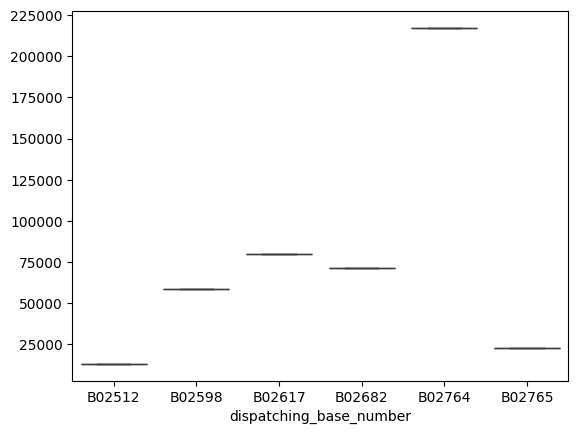

In [107]:
group = janfeb.groupby("dispatching_base_number")["active_vehicles"].sum()

plt.subplot(3,2,1)
sns.boxplot(x = group.index, y = group.values)